# mask-and-sort.ipynb 

## Import packages

In [1]:
# Standard library imports
from pathlib import Path
# Third-party imports
import imageio as iio
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from skimage import color, filters, measure, util
# Local imports
import helpers
# Autoreload local imports at each cell execution
%load_ext autoreload
%autoreload 2

## Load image

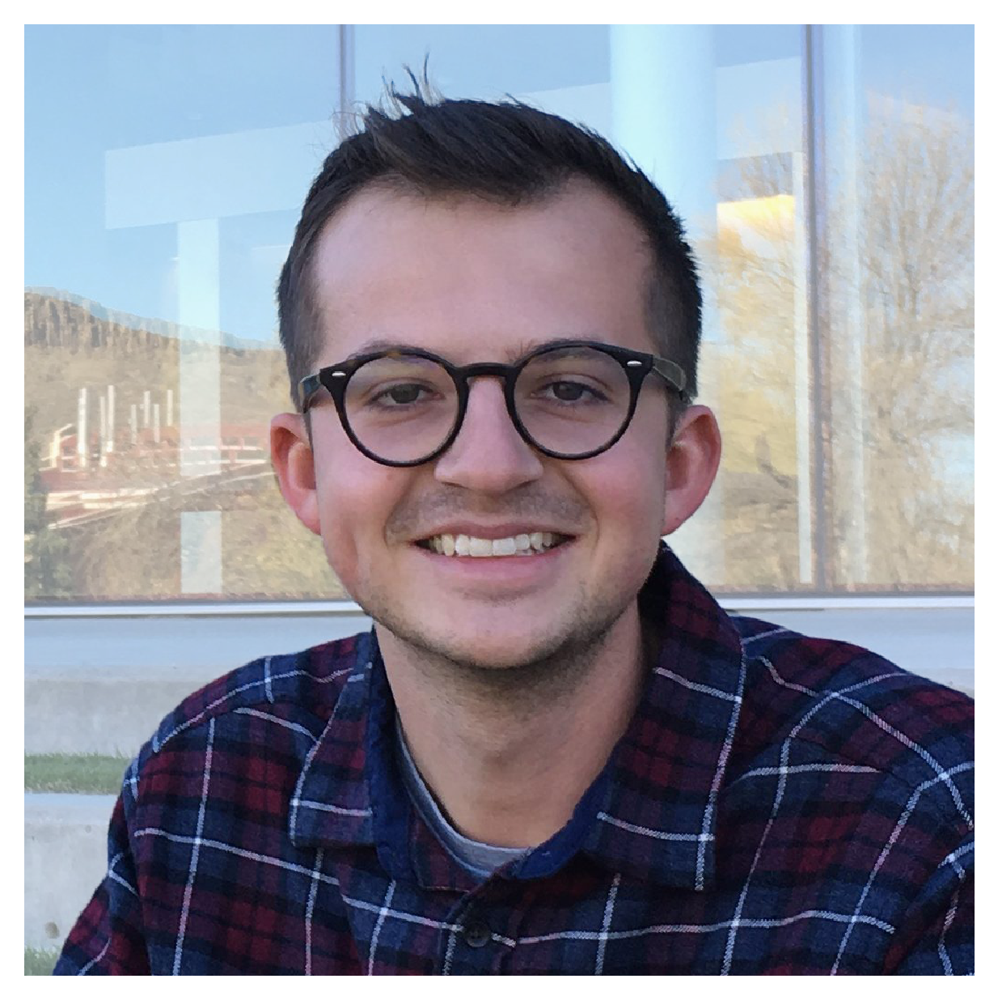

In [25]:
pfp = iio.imread('profile_pic_square_60_pct_bg.png')
fig, ax = helpers.plot_imgs(pfp)
plt.show()

In [3]:
pfp.shape

(1050, 1049, 4)

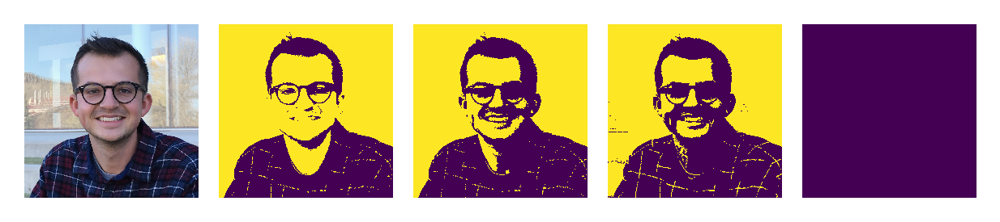

In [4]:
masks = []
for chan in range(pfp.shape[2]):
    thresh_val = filters.threshold_otsu(pfp[..., chan])
    masks.append(pfp[..., chan] > thresh_val)
fig, ax = helpers.plot_imgs([pfp] + masks)
plt.show()

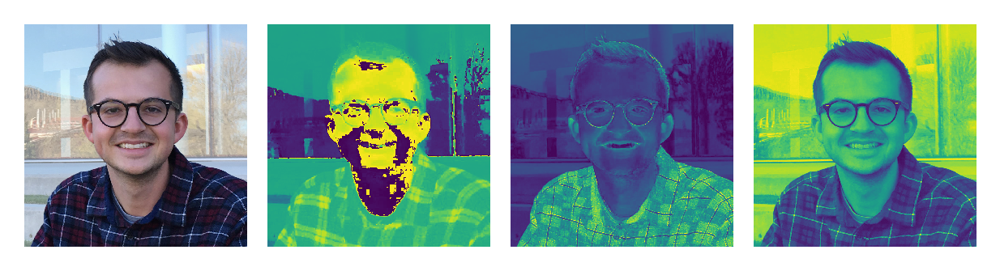

In [5]:
pfp_hsv = color.rgb2hsv(pfp[..., :3])
# helpers.plot_imgs()
hsv_chans = np.split(pfp_hsv, 3, axis=2)
fig, axes = helpers.plot_imgs([pfp] + hsv_chans)
plt.show()

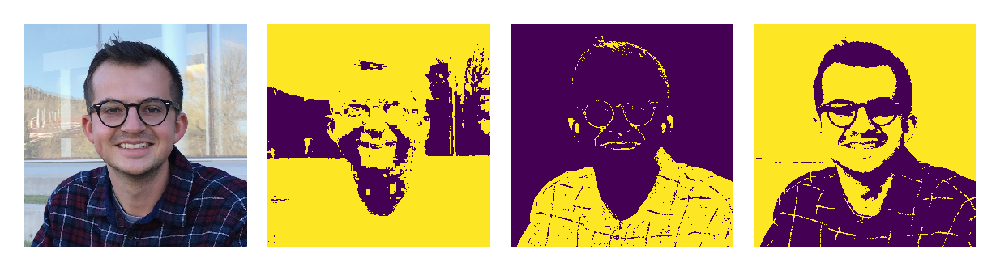

In [6]:
hsv_otsu_masks = []
for chan in range(pfp_hsv.shape[2]):
    thresh_val = filters.threshold_otsu(pfp_hsv[..., chan])
    hsv_otsu_masks.append(pfp_hsv[..., chan] > thresh_val)
fig, ax = helpers.plot_imgs([pfp] + hsv_otsu_masks)
plt.show()

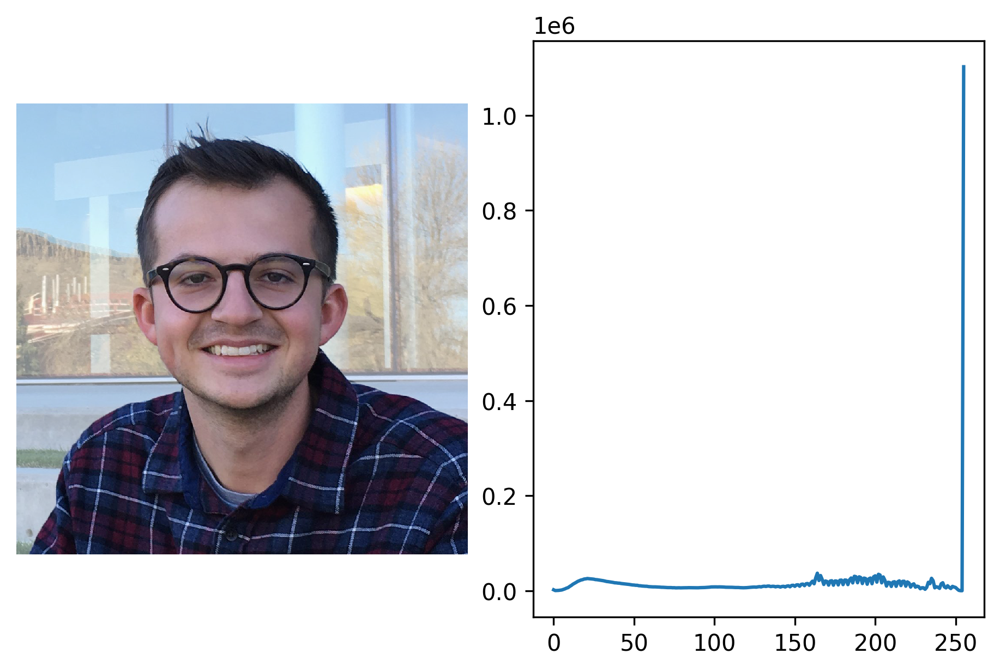

In [7]:
fig, ax = helpers.plot_hist(pfp)
plt.show()

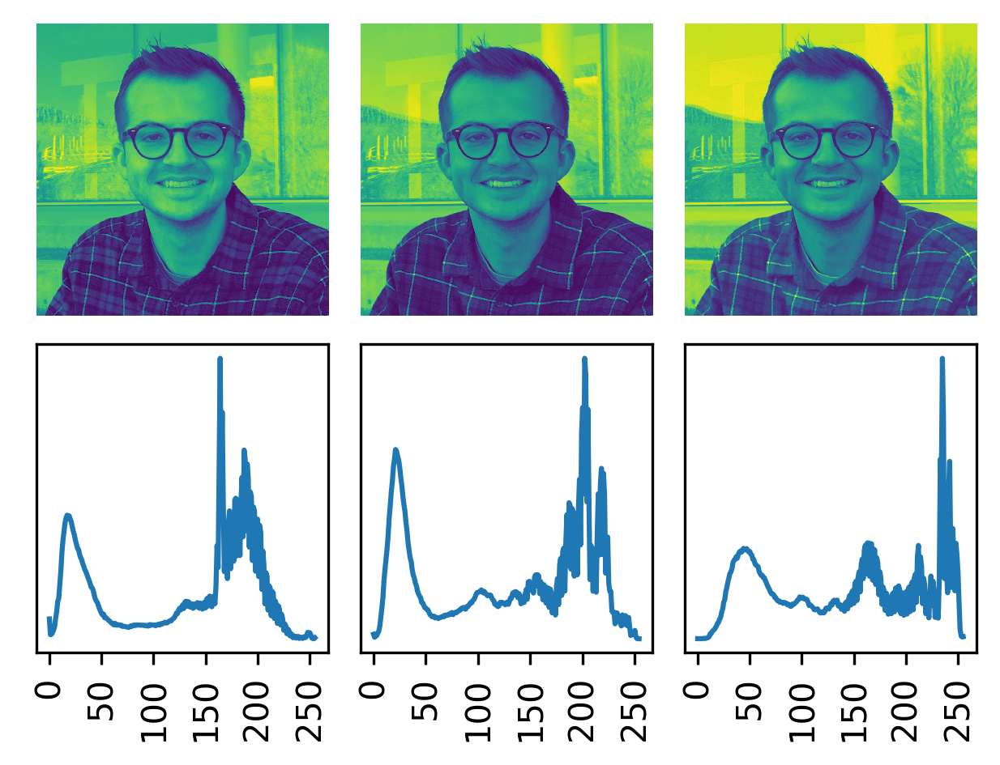

In [8]:
rgb_chans = [
    chan.reshape(pfp.shape[0], pfp.shape[1]) 
    for chan in np.split(pfp[...,:3], 3, axis=2)
]
fig, ax = helpers.plot_imgs(
    rgb_chans, show_hist=True)
plt.show()

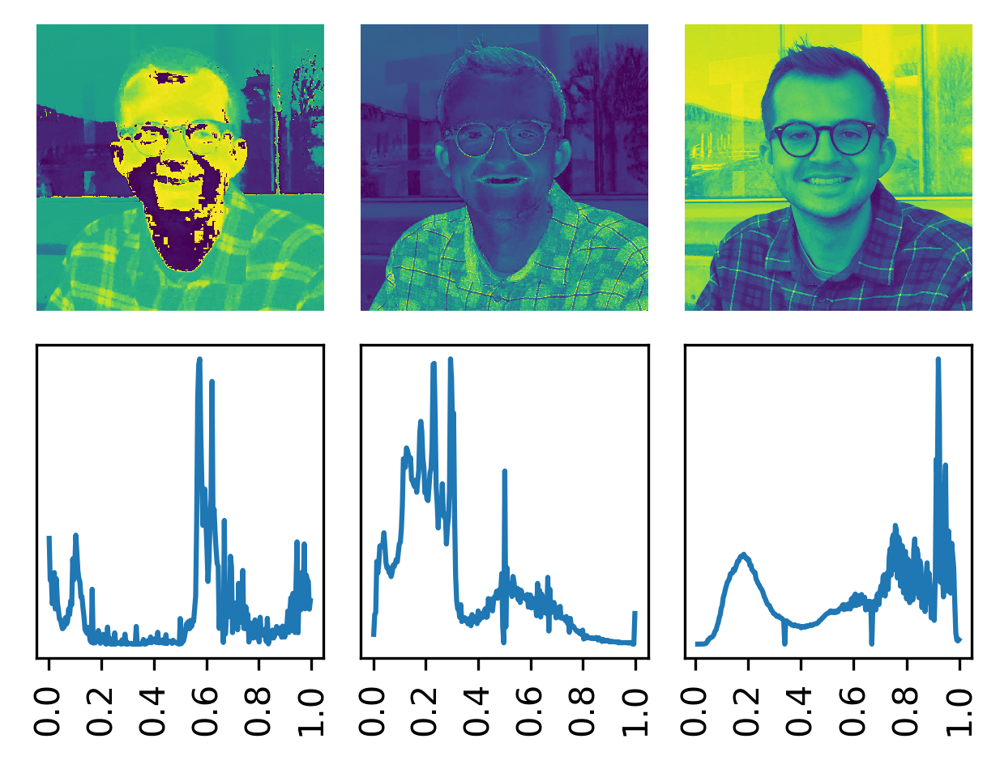

In [9]:
hsv_chans = [
    chan.reshape(pfp.shape[0], pfp.shape[1]) 
    for chan in np.split(pfp_hsv, 3, axis=2)
]
fig, ax = helpers.plot_imgs(
    hsv_chans, show_hist=True)
plt.show()

## Combine image masks 

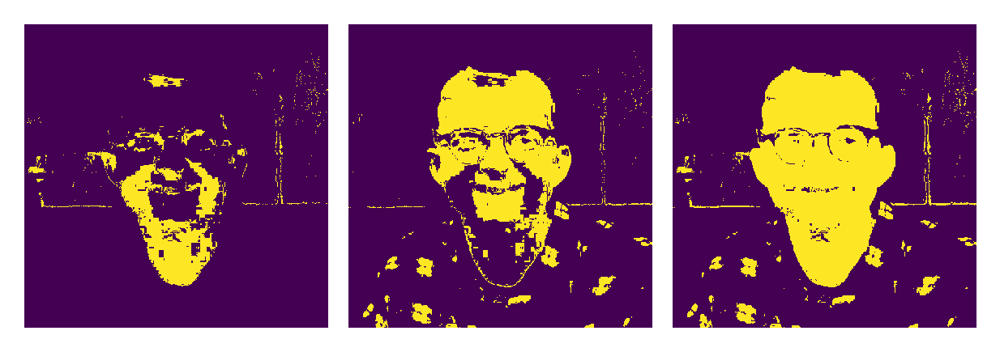

In [10]:
h_mask_l_005 = hsv_chans[0] < 0.05
h_mask_u_08 = hsv_chans[0] > 0.8
h_mask_face = h_mask_l_005 + h_mask_u_08
fig, ax = helpers.plot_imgs([h_mask_l_005, h_mask_u_08, h_mask_face])
plt.show()

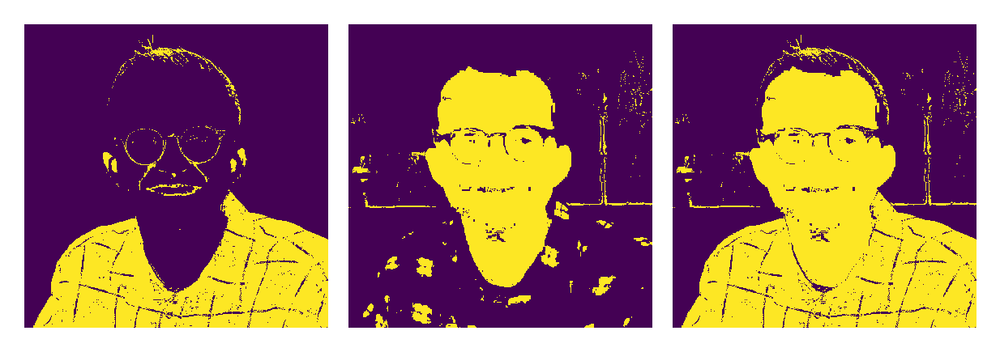

In [11]:
s_otsu_mask = hsv_otsu_masks[1]
hairless_gus_mask = s_otsu_mask + h_mask_face
fig, ax = helpers.plot_imgs([s_otsu_mask, h_mask_face, hairless_gus_mask])
plt.show()

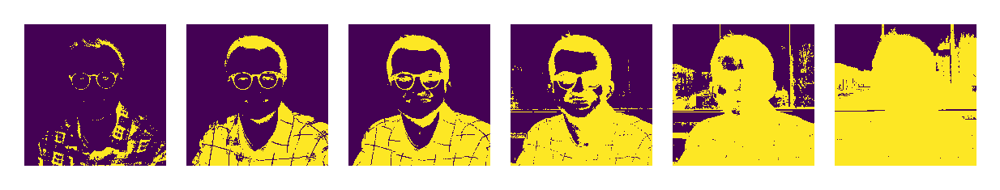

In [12]:
v_thresh_vals = np.arange(0.15, 1, 0.15)
v_masks_l = [hsv_chans[2] < val for val in v_thresh_vals]
fig, ax = helpers.plot_imgs(v_masks_l)
plt.show()

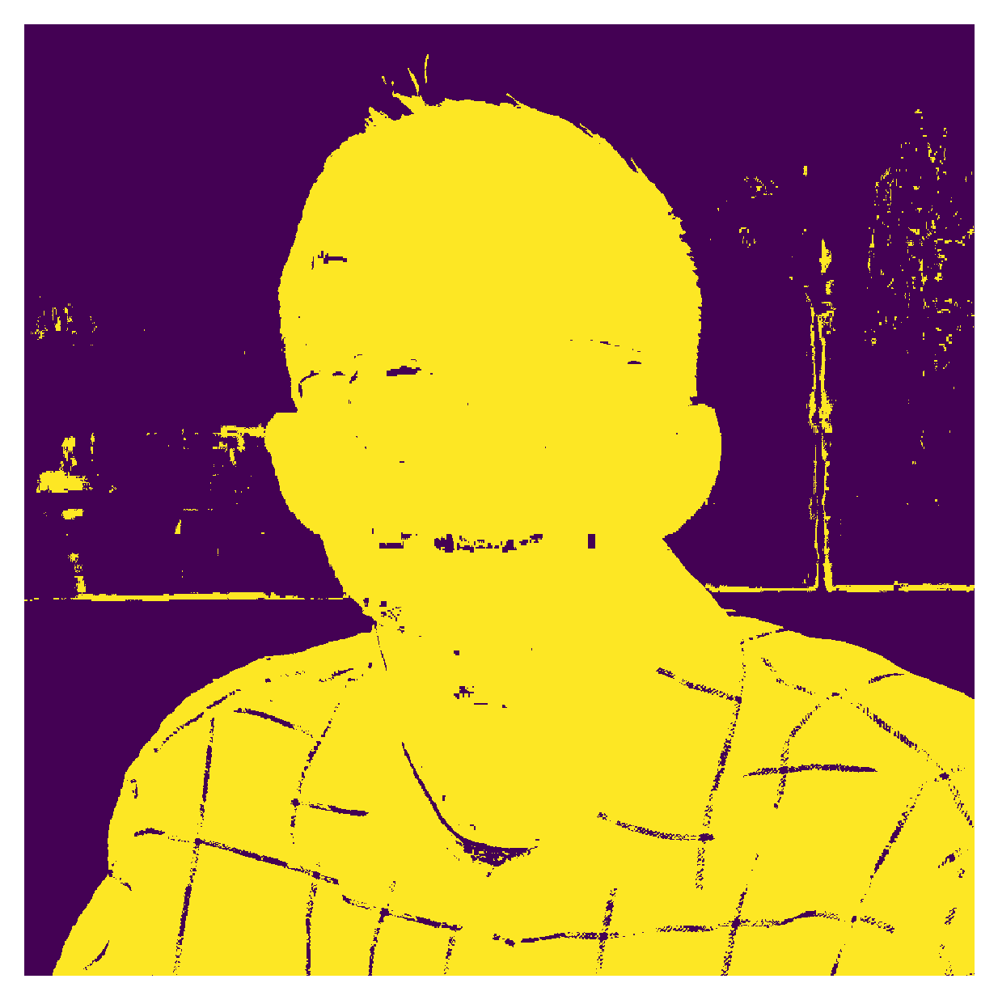

In [13]:
full_gus_mask = v_masks_l[2] + hairless_gus_mask
fig, ax = helpers.plot_imgs(full_gus_mask)
plt.show()

## Morphological operations to improve mask quality

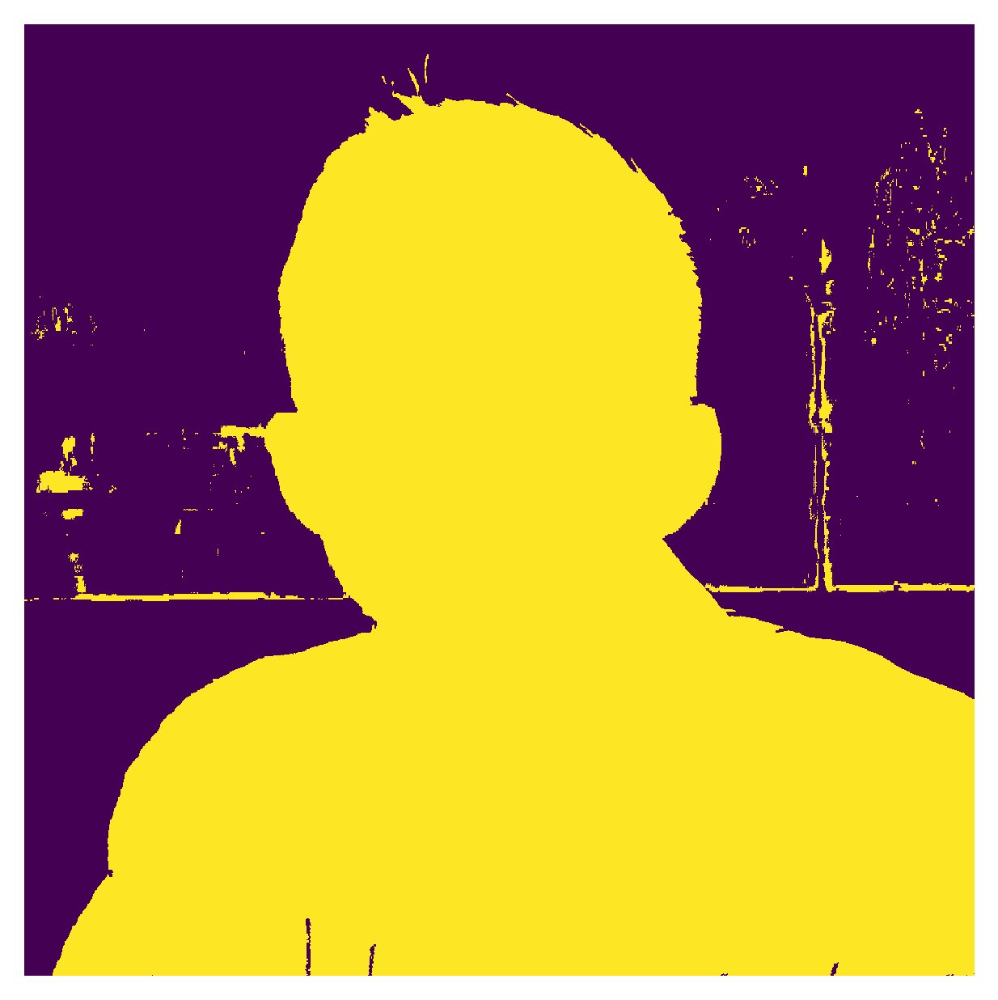

In [14]:
gus_mask_filled = ndimage.binary_fill_holes(full_gus_mask)
fig, ax = helpers.plot_imgs(gus_mask_filled)
plt.show()

67
587070


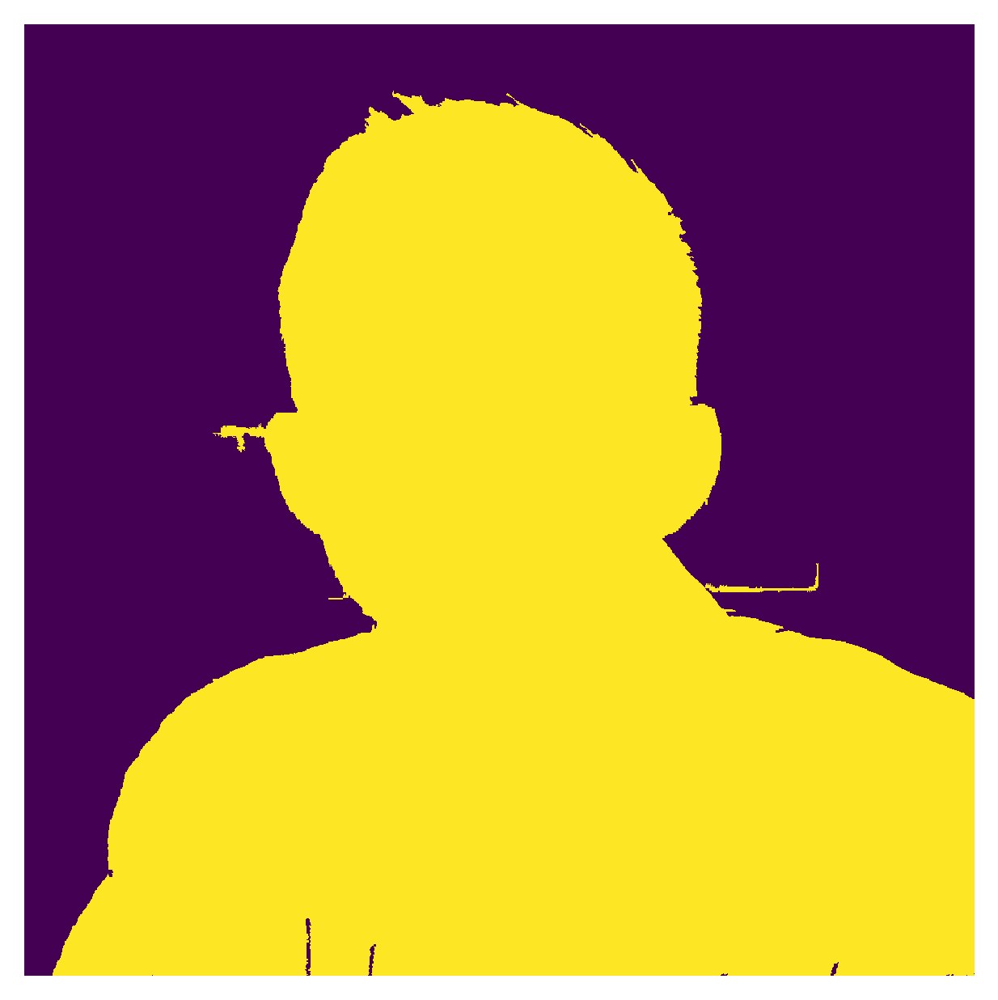

In [15]:
labels = measure.label(gus_mask_filled)
regions = measure.regionprops(labels)
print(regions[0].area)
regions.sort(key=lambda reg: reg.area, reverse=True)
print(regions[0].area)
gus_mask_cleared = np.zeros_like(gus_mask_filled)
gus_mask_cleared[labels == regions[0].label] = 1
fig, ax = helpers.plot_imgs(gus_mask_cleared)
plt.show()

513934
513934


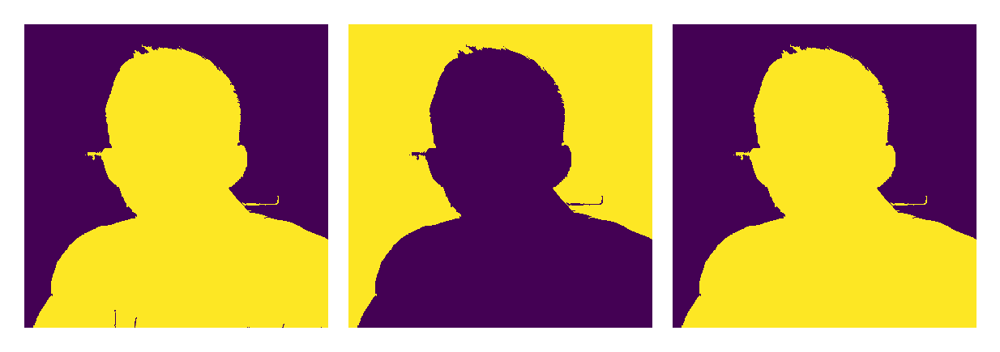

In [16]:
gus_mask_cleared_inv = 1 - gus_mask_cleared
labels = measure.label(gus_mask_cleared_inv)
regions = measure.regionprops(labels)
print(regions[0].area)
regions.sort(key=lambda reg: reg.area, reverse=True)
print(regions[0].area)
gus_mask_inv = np.zeros_like(gus_mask_filled)
gus_mask_inv[labels == regions[0].label] = 1
gus_mask = 1 - gus_mask_inv
fig, ax = helpers.plot_imgs(
    [gus_mask_cleared, gus_mask_inv, gus_mask]
)
plt.show()

## Use gus_mask to mask original image

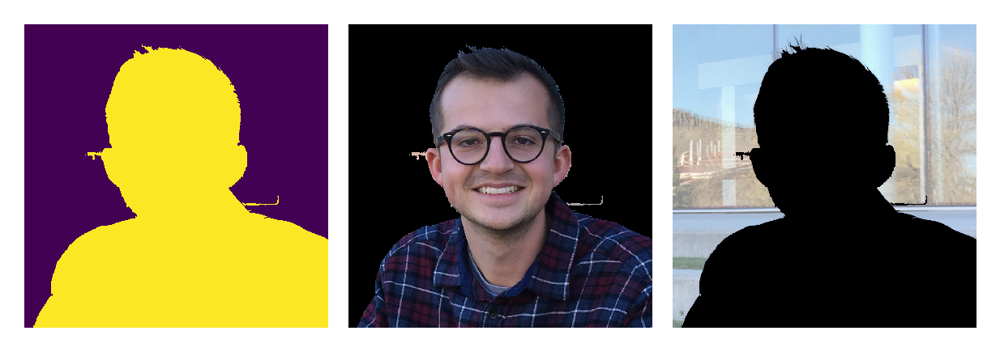

In [17]:
gus_only = np.stack([gus_mask * chan for chan in rgb_chans], axis=2)
bg_only = np.stack([gus_mask_inv * chan for chan in rgb_chans], axis=2)
fig, ax = helpers.plot_imgs([gus_mask, gus_only, bg_only])
plt.show()

## Sort BG pixels

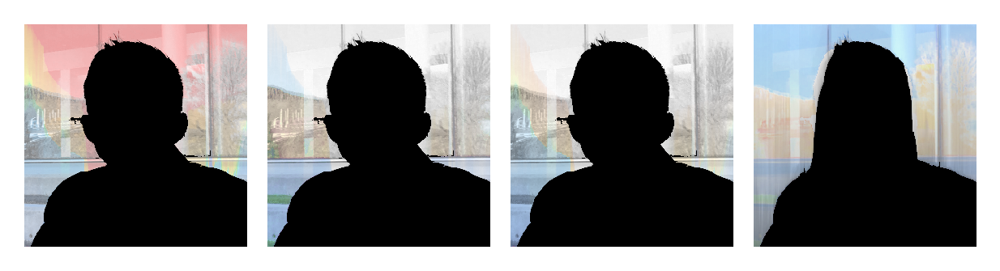

In [18]:
bg_only_hsv = color.rgb2hsv(bg_only)
h_sorted = bg_only_hsv.copy()
s_sorted = bg_only_hsv.copy()
v_sorted = bg_only_hsv.copy()
hs_sorted = bg_only_hsv.copy()
for col_i in range(bg_only_hsv.shape[1]):
    h_col_i = bg_only_hsv[:, col_i, 0]
    h_col_i.sort()
    h_sorted[:, col_i, 0] = h_col_i
    s_col_i = bg_only_hsv[:, col_i, 1]
    s_col_i.sort()
    s_sorted[:, col_i, 1] = s_col_i
    hs_sorted[:, col_i, 0] = h_col_i 
    hs_sorted[:, col_i, 1] = s_col_i 
    v_col_i = bg_only_hsv[:, col_i, 2]
    v_col_i = sorted(v_col_i, reverse=True)
    v_sorted[:, col_i, 2] = v_col_i
bg_only_h_sorted = color.hsv2rgb(h_sorted)
bg_only_s_sorted = color.hsv2rgb(s_sorted)
bg_only_hs_sorted = color.hsv2rgb(hs_sorted)
bg_only_v_sorted = color.hsv2rgb(v_sorted)
fig, ax = helpers.plot_imgs([bg_only_h_sorted, bg_only_s_sorted, bg_only_hs_sorted, bg_only_v_sorted])
plt.show()

c:\Users\cgusb\Python\envs\napari-env\lib\site-packages\skimage\util\dtype.py:541: UserWarning: Downcasting int32 to uint8 without scaling because max value 255 fits in uint8
  return _convert(image, np.uint8, force_copy)


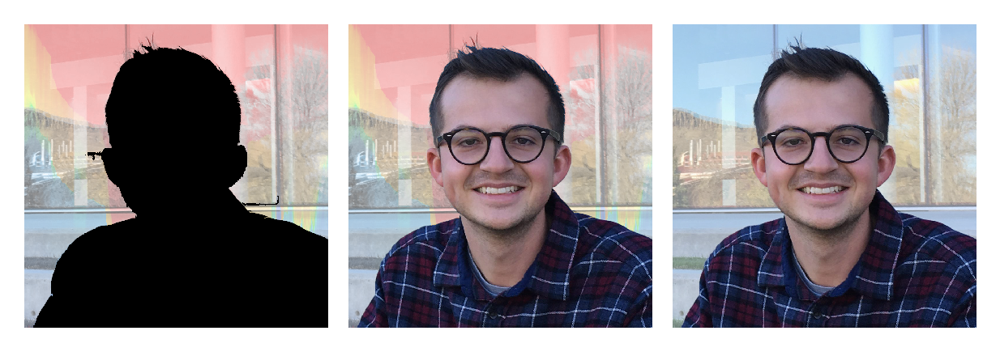

In [19]:
pfp_bg_h_sorted = bg_only_h_sorted.copy()
gus_only = util.img_as_ubyte(gus_only)
pfp_bg_h_sorted = util.img_as_ubyte(pfp_bg_h_sorted)
# pfp_bg_h_sorted[bg_only == 0] = 0
pfp_bg_h_sorted = pfp_bg_h_sorted + gus_only
fig, ax = helpers.plot_imgs([bg_only_h_sorted, pfp_bg_h_sorted, pfp])
# iio.imsave('pfp-bg_h_sorted.png', pfp_bg_h_sorted)
plt.show()

## Sort pixels without removing Gus

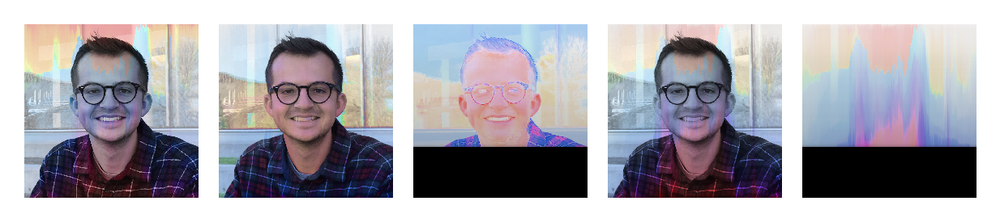

In [20]:
pfp_h_sorted = pfp_hsv.copy()
pfp_s_sorted = pfp_hsv.copy()
pfp_hs_sorted = pfp_hsv.copy()
pfp_v_sorted = pfp_hsv.copy()
pfp_hsv_sorted = pfp_hsv.copy()
for col_i in range(pfp_hsv.shape[1]):
    pfp_h_col_i = pfp_hsv[:, col_i, 0]
    pfp_h_col_i.sort()
    pfp_h_sorted[:, col_i, 0] = pfp_h_col_i
    pfp_s_col_i = pfp_hsv[:, col_i, 1]
    pfp_s_col_i.sort()
    pfp_s_sorted[:, col_i, 1] = pfp_s_col_i
    pfp_hs_sorted[:, col_i, 0] = pfp_h_col_i
    pfp_hs_sorted[:, col_i, 1] = pfp_s_col_i
    pfp_v_col_i = sorted(v_col_i, reverse=True)
    pfp_v_sorted[:, col_i, 2] = pfp_v_col_i
    pfp_hsv_sorted[:, col_i, 0] = pfp_h_col_i
    pfp_hsv_sorted[:, col_i, 1] = pfp_s_col_i
    pfp_hsv_sorted[:, col_i, 2] = pfp_v_col_i
pfp_h_sorted = color.hsv2rgb(pfp_h_sorted)
pfp_s_sorted = color.hsv2rgb(pfp_s_sorted)
pfp_hs_sorted = color.hsv2rgb(pfp_hs_sorted)
pfp_v_sorted = color.hsv2rgb(pfp_v_sorted)
pfp_hsv_sorted = color.hsv2rgb(pfp_hsv_sorted)
fig, ax = helpers.plot_imgs([
    pfp_h_sorted, pfp_s_sorted, pfp_v_sorted,
    pfp_hs_sorted, pfp_hsv_sorted 
])
plt.show()

In [22]:
pfp[..., :3].shape

(1050, 1049, 3)

In [36]:
def sort_pixels(
    img, chans=[0, 1, 2], reverse=[False, False,False]
):
    img_sorted = img.copy()
    for chan_i in chans:
        for col_i in range(img.shape[1]):
            col = img[:, col_i, chan_i].copy()
            col = sorted(col, reverse=reverse[chan_i])
            img_sorted[:, col_i, chan_i] = col
    return img_sorted

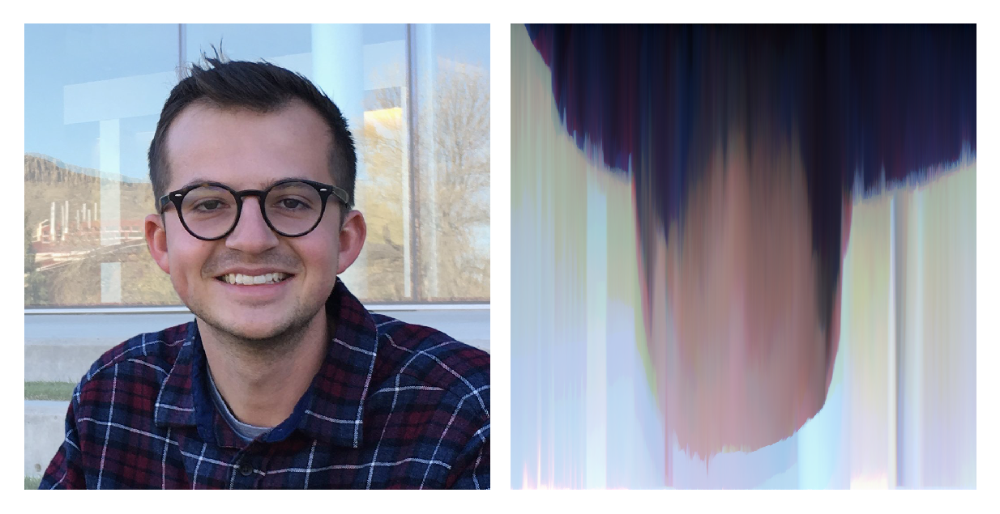

In [37]:
pfp_sorted = sort_pixels(pfp[..., :3])
fig, ax = helpers.plot_imgs([
    pfp, 
    pfp_sorted
])
plt.show()

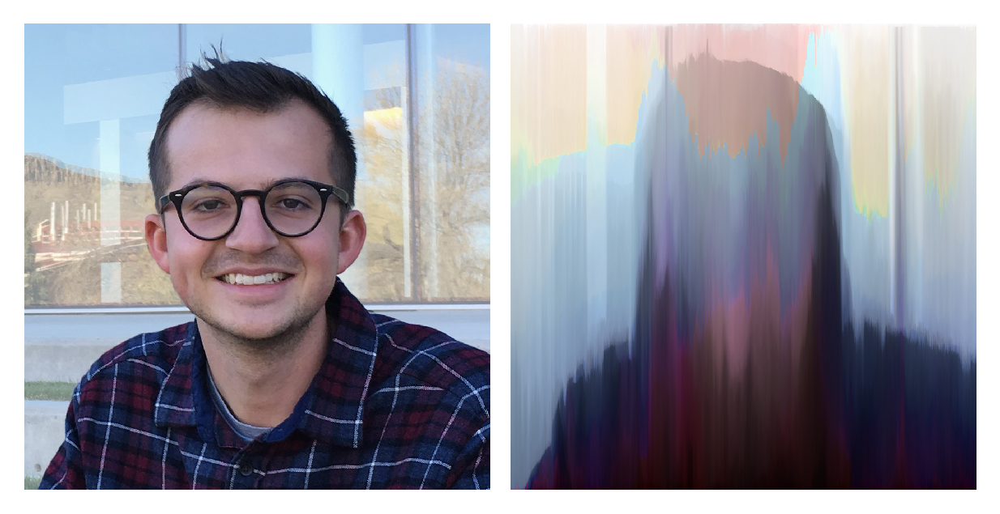

In [44]:
pfp_hsv = color.rgb2hsv(pfp[..., :3])
pfp_hsv_sorted = sort_pixels(
    pfp_hsv, chans=[0, 1, 2], reverse=[False, False, True]
)
pfp_hsv_sorted_rgb = util.img_as_ubyte(
    color.hsv2rgb(pfp_hsv_sorted)
)
fig, ax = helpers.plot_imgs([
    pfp, pfp_hsv_sorted_rgb,
])
plt.show()

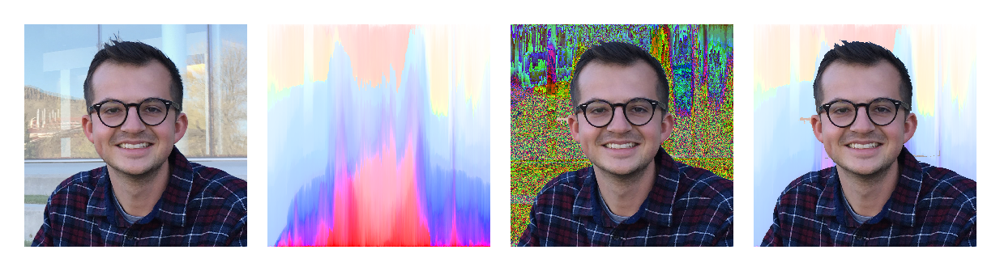

In [56]:
pfp_hsv_sorted_no_v = pfp_hsv_sorted.copy()
pfp_hsv_sorted_no_v[..., 2] = 1
pfp_hsv_sorted_no_v_rgb = util.img_as_ubyte(
    color.hsv2rgb(pfp_hsv_sorted_no_v)
)
hs_sorted_bg = pfp_hsv_sorted_no_v_rgb.copy()
gus_glitch_bg = hs_sorted_bg * bg_only + gus_only
gus_hs_sorted_bg = np.stack(
    [
        chan.reshape(hs_sorted_bg.shape[0], hs_sorted_bg.shape[1])
        * gus_mask_inv for chan in np.split(hs_sorted_bg, 3, axis=2)
    ], axis=2
) + gus_only
# iio.imsave('pfp-bg_hs_sorted.png', gus_hs_sorted_bg)
# iio.imsave('pfp-bg_glitch.png', gus_glitch_bg)
fig, ax = helpers.plot_imgs([
    pfp, pfp_hsv_sorted_no_v_rgb, gus_glitch_bg, gus_hs_sorted_bg
])
plt.show()

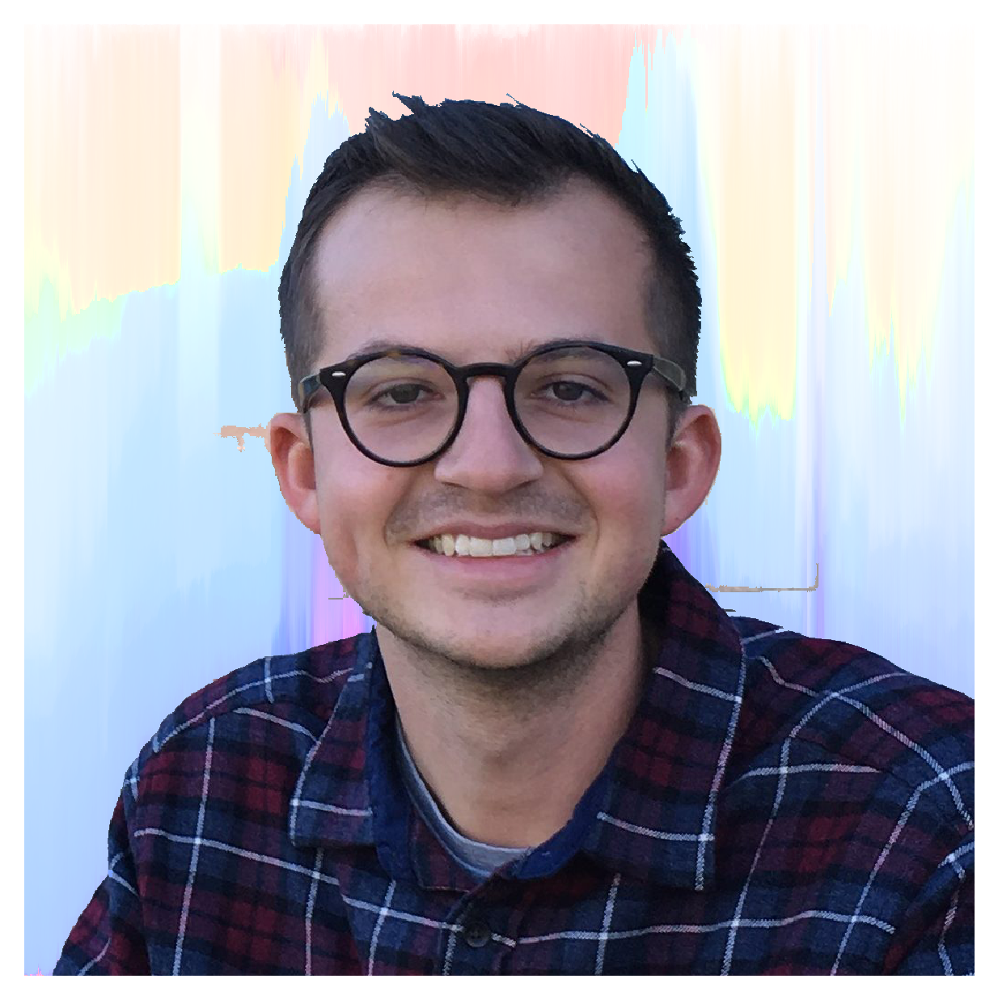

In [57]:
fig, ax = helpers.plot_imgs([
    gus_hs_sorted_bg
])
plt.show()

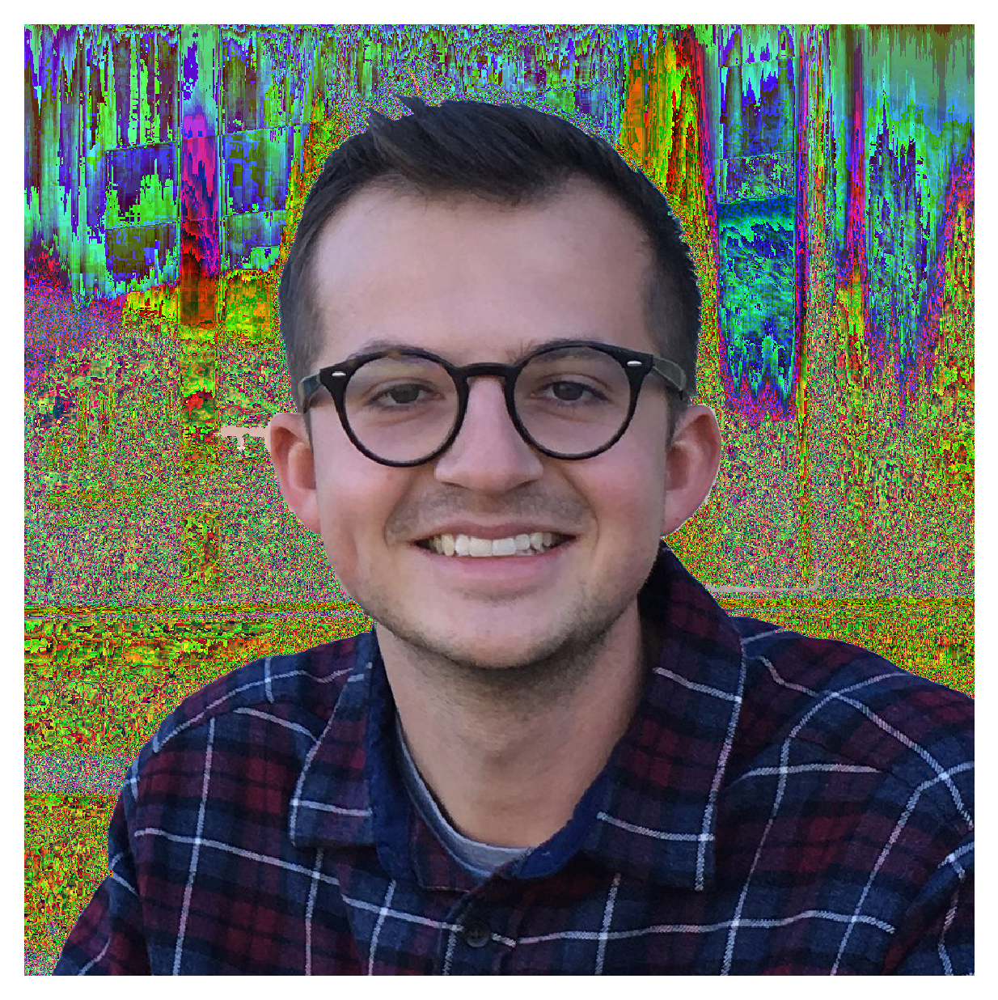

In [58]:
fig, ax = helpers.plot_imgs([
    gus_glitch_bg
])
plt.show()

uint8
uint8


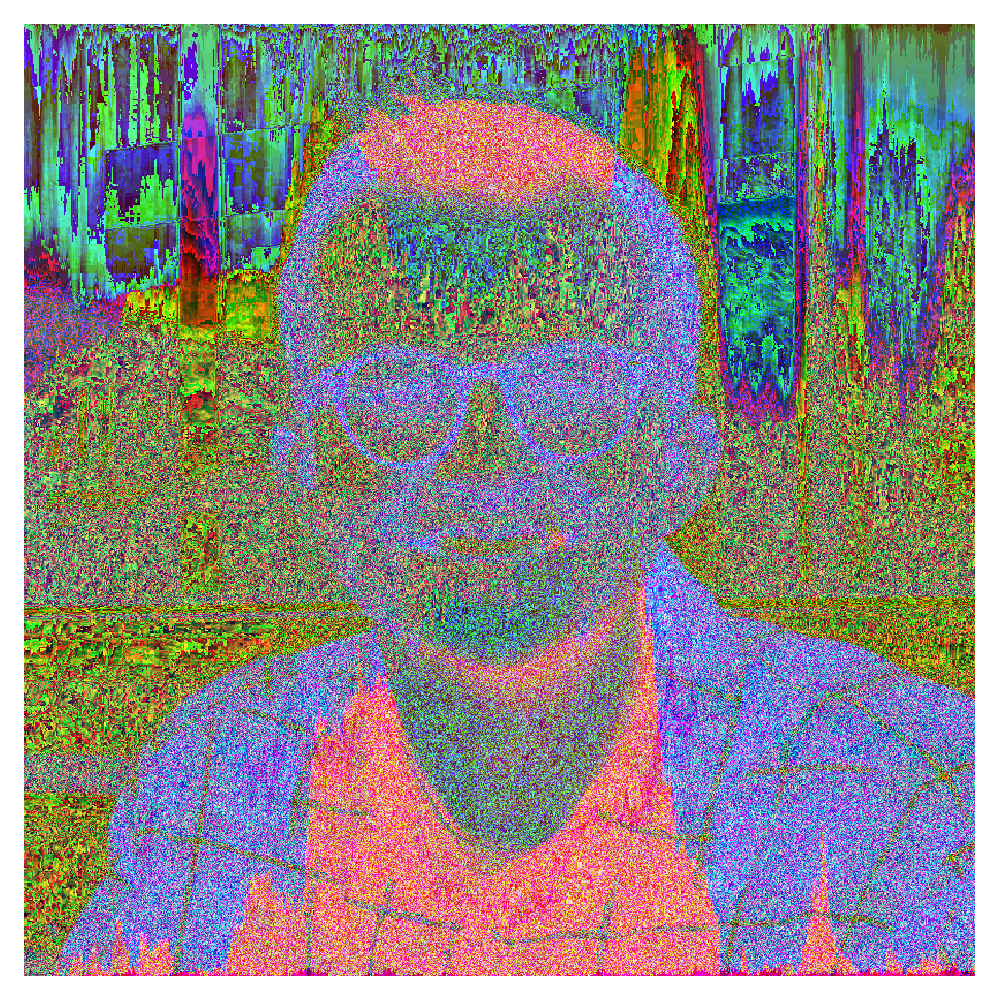

In [62]:
print(hs_sorted_bg.dtype)
print(pfp.dtype)
gus_glitch = hs_sorted_bg * pfp[..., :3]
# iio.imsave('pfp-glitch.png', gus_glitch)
fig, ax = helpers.plot_imgs(gus_glitch)
plt.show()